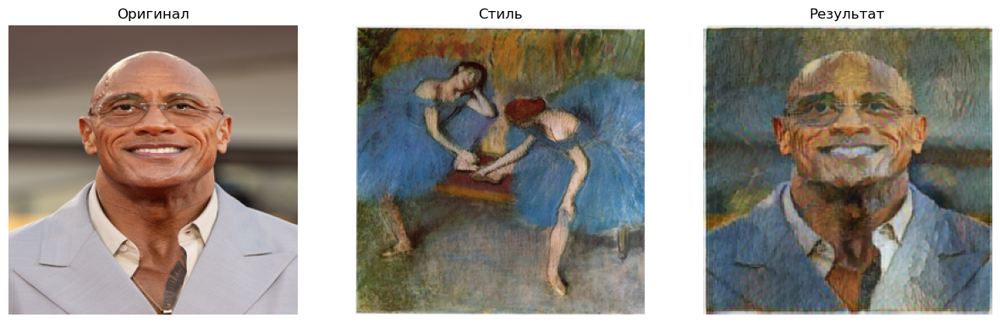

In [5]:
import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

def load_image(image_path, target_size=(256, 256)):
    img = Image.open(image_path).convert('RGB')
    img = img.resize(target_size, Image.Resampling.LANCZOS)
    img_array = np.array(img) / 255.0
    return tf.constant(img_array[np.newaxis, :, :, :], dtype=tf.float32)

def show_image(tensor, title):
    plt.imshow(tensor[0] if len(tensor.shape) == 4 else tensor)
    plt.title(title)
    plt.axis('off')
    plt.show()

hub_model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')

content = load_image(r'C:\Users\user\Pictures\Dwayne_Johnson-1809_(cropped).jpg')     
style = load_image(r'C:\Users\user\Pictures\396470.jpg')      

result = hub_model(content, style)[0]

plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(content[0])
plt.title('Оригинал')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(style[0])
plt.title('Стиль')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(result[0])
plt.title('Результат')
plt.axis('off')
plt.show()

Using cache found in C:\Users\user/.cache\torch\hub\bryandlee_animegan2-pytorch_main
Using cache found in C:\Users\user/.cache\torch\hub\bryandlee_animegan2-pytorch_main


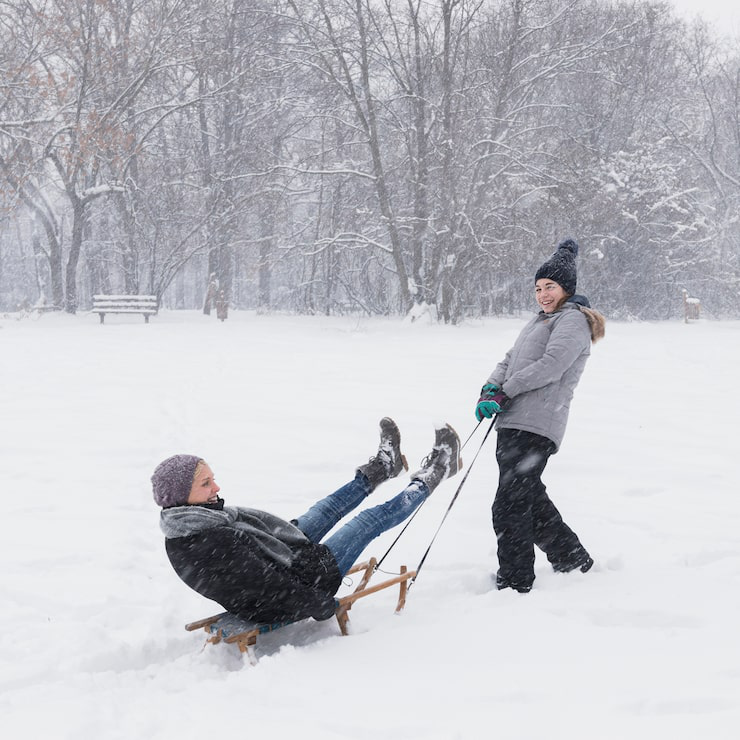

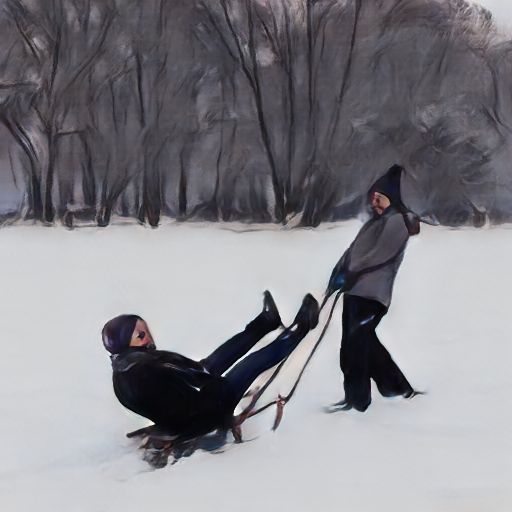

In [12]:
import torch
from PIL import Image
from IPython.display import display

model = torch.hub.load("bryandlee/animegan2-pytorch:main", "generator", pretrained="face_paint_512_v2")
face2paint = torch.hub.load("bryandlee/animegan2-pytorch:main", "face2paint", size=512)


filename = r'C:\Users\user\Pictures\smiling-girl-pulling-her-mother-sledge-forest-snowing_23-2148049102.jpg'
img = Image.open(filename).convert("RGB")
display(img)
out = face2paint(model, img)
display(out)
out.save('result.jpg')
    

Using cache found in C:\Users\user/.cache\torch\hub\bryandlee_animegan2-pytorch_main
Using cache found in C:\Users\user/.cache\torch\hub\bryandlee_animegan2-pytorch_main


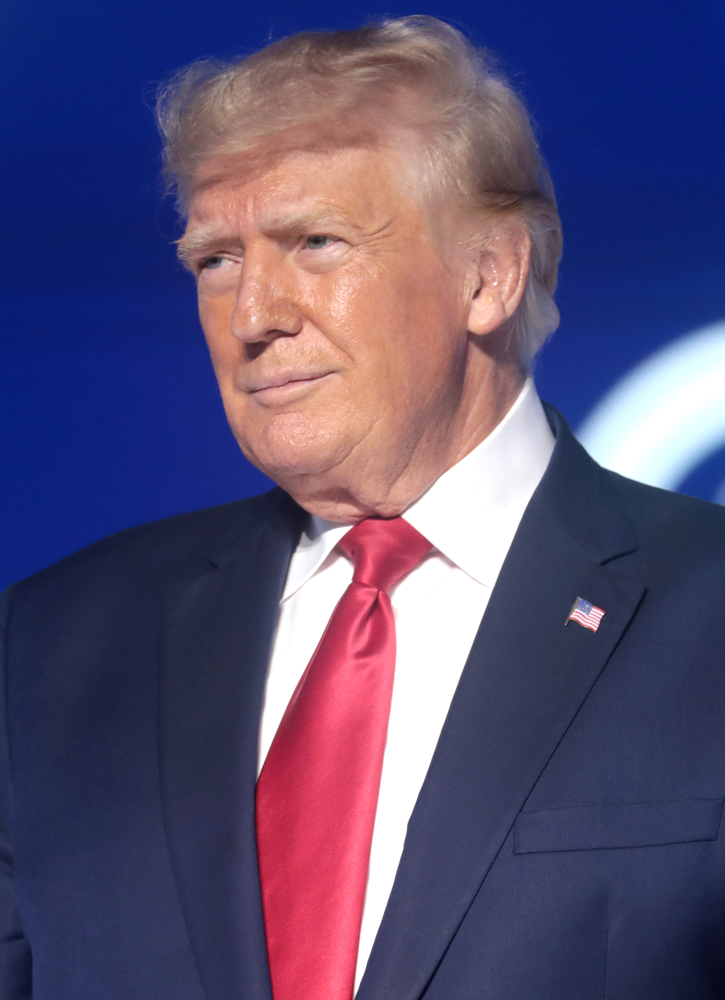

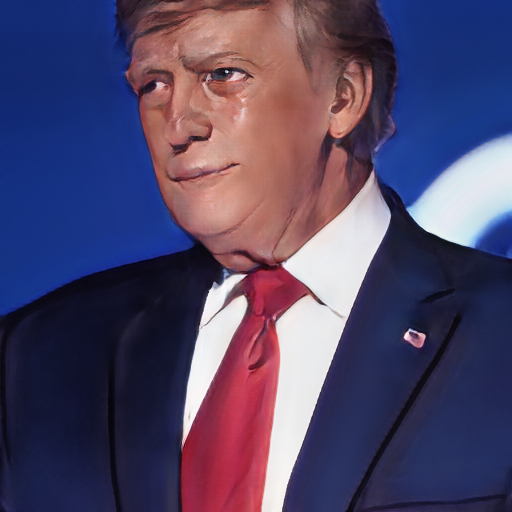

In [15]:
import torch
from PIL import Image
import matplotlib.pyplot as plt
from IPython.display import display

model = torch.hub.load("bryandlee/animegan2-pytorch:main", "generator", pretrained="face_paint_512_v2")
face2paint = torch.hub.load("bryandlee/animegan2-pytorch:main", "face2paint", size=512)

image = r'C:\Users\user\Pictures\Donald_Trump_(52251902811)_(cropped).jpg'

img = Image.open(image).convert("RGB")  
display(img)
out = face2paint(model, img)
display(out)

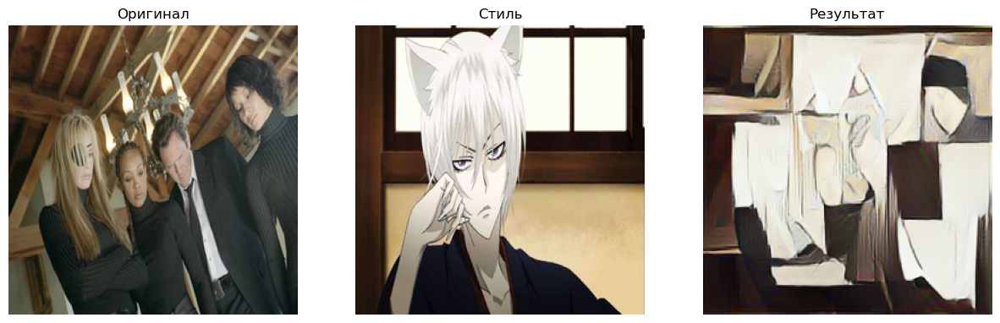

In [1]:
import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

def load_image(image_path, target_size=(256, 256)):
    img = Image.open(image_path).convert('RGB')
    img = img.resize(target_size, Image.Resampling.LANCZOS)
    img_array = np.array(img) / 255.0
    return tf.constant(img_array[np.newaxis, :, :, :], dtype=tf.float32)

def show_image(tensor, title):
    plt.imshow(tensor[0] if len(tensor.shape) == 4 else tensor)
    plt.title(title)
    plt.axis('off')
    plt.show()

hub_model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')

content = load_image(r'C:\Users\user\Pictures\1920x.jfif')     
style = load_image(r'C:\Users\user\Pictures\c9c55a762b292a38ceb58ce229534d61.jpg')      

result = hub_model(content, style)[0]

plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(content[0])
plt.title('Оригинал')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(style[0])
plt.title('Стиль')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(result[0])
plt.title('Результат')
plt.axis('off')
plt.show()

Fetching 7 files:   0%|          | 0/7 [00:00<?, ?it/s]

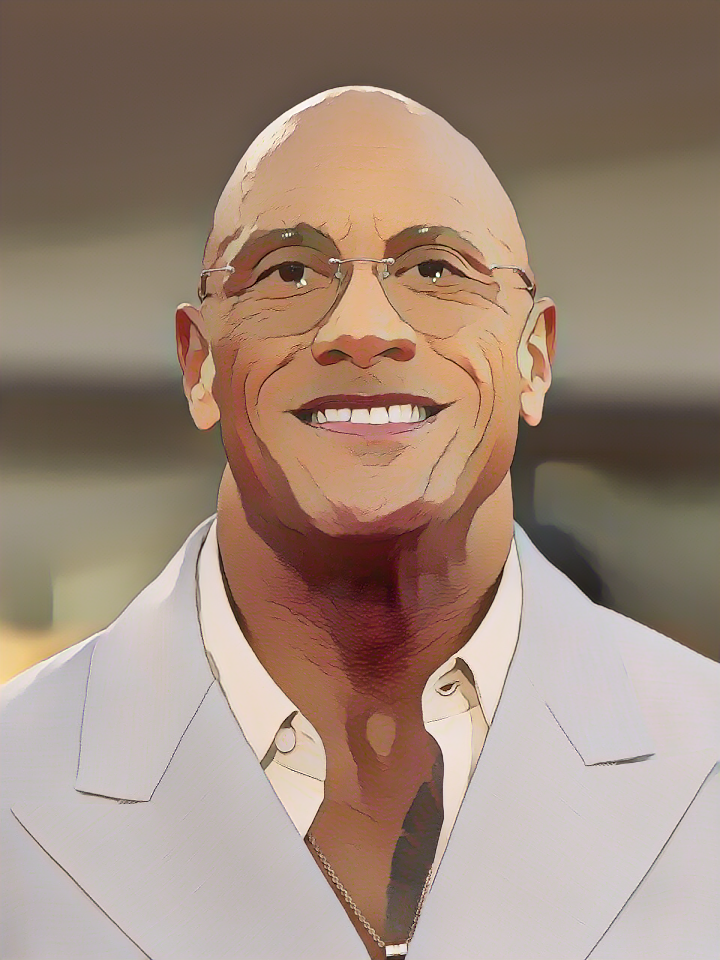

In [11]:
import cv2
import numpy as np
import tensorflow as tf
from huggingface_hub import snapshot_download
from PIL import Image

def resize_crop(image):
    h, w, c = np.shape(image)
    if min(h, w) > 720:
        if h > w:
            h, w = int(720 * h / w), 720
        else:
            h, w = 720, int(720 * w / h)
    image = cv2.resize(image, (w, h), interpolation=cv2.INTER_AREA)
    h, w = (h // 8) * 8, (w // 8) * 8
    image = image[:h, :w, :]
    return image

def load_image(path):  
    image = Image.open(path)  
    image = image.convert("RGB")
    image = np.array(image)
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
    return image

def preprocess_image(image):
    image = resize_crop(image)
    image = image.astype(np.float32) / 127.5 - 1
    image = np.expand_dims(image, axis=0)
    image = tf.constant(image)
    return image


model_path = snapshot_download("sayakpaul/whitebox-cartoonizer")
loaded_model = tf.saved_model.load(model_path)
concrete_func = loaded_model.signatures["serving_default"]


image_path = r"C:\Users\user\Pictures\Dwayne_Johnson-1809_(cropped).jpg"
image = load_image(image_path) 
preprocessed_image = preprocess_image(image)


result = concrete_func(preprocessed_image)["final_output:0"]

output = (result[0].numpy() + 1.0) * 127.5
output = np.clip(output, 0, 255).astype(np.uint8)
output = cv2.cvtColor(output, cv2.COLOR_BGR2RGB)
output_image = Image.fromarray(output)
output_image.save("result.png")
from IPython.display import display  
display(output_image)  

In [ ]:
import torch
from diffusers import DiffusionPipeline
from diffusers.utils import load_image
from PIL import Image  


pipe = DiffusionPipeline.from_pretrained("AnalogMutations/cartoonizer", 
                                        dtype=torch.bfloat16, 
                                        device_map="cpu")

prompt = "Turn this guy into a cartoon character"  


input_image = Image.open(r'C:\Users\user\Pictures\2050123075_0_0_3073_1728_1920x1080_80_0_0_d19d401ba122ca612837acbb763749cc.jpg')

image = pipe(image=input_image, prompt=prompt).images[0]

from IPython.display import display
display(image)


In [ ]:
import torch
from diffusers import DiffusionPipeline
from diffusers.utils import load_image
from PIL import Image
from IPython.display import display


pipe = DiffusionPipeline.from_pretrained(
    "black-forest-labs/FLUX.1-Kontext-dev", 
    dtype=torch.bfloat16, 
    device_map="cpu"
)


pipe.load_lora_weights("Kontext-Style/Van_Gogh_lora")
prompt = "Transform this cute cat into Van Gogh painting style, vibrant colors, expressive brushstrokes"
input_image = Image.open(r'C:\Users\user\Pictures\British_shorthair_with_calico_coat_(1).jpg')

image = pipe(image=input_image, prompt=prompt).images[0]


print("Исходный котик:")
display(input_image)

print("Котик Ван Гога:")
display(image)
image.save("van_gogh_cat.png")